# FINAL GROUP PROJECT (DATA MINING & BIG DATA)


Authors:
Roman Dolgopolyi, Ioanna Amaslidou, Agrippina Margaritou

### Install and Import Requirements 

In [358]:
# dowload all neccessary libraries
!pip install pandas numpy matplotlib seaborn plotly scikit-learn statsmodels


[notice] A new release of pip is available: 24.2 -> 25.0.1
[notice] To update, run: pip install --upgrade pip


In [359]:
# libraries needed
from sklearn.metrics import silhouette_score, f1_score, accuracy_score, roc_auc_score, mean_squared_error, r2_score, mean_absolute_error
from sklearn.preprocessing import StandardScaler, MinMaxScaler, MaxAbsScaler
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.cluster import KMeans, AgglomerativeClustering
from sklearn.tree import DecisionTreeRegressor, plot_tree
from sklearn.ensemble import RandomForestRegressor
from sklearn.decomposition import PCA
import plotly.graph_objects as go
from scipy.stats import pearsonr
import matplotlib.pyplot as plt
import statsmodels.api as sm
import seaborn as sns
import pandas as pd
import numpy as np
import time


### Data Preprocessing

Data Reading

In [360]:
# data loading
data = pd.read_csv('Life Expectancy Data.csv')
data.head()

,Country,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,...,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
0,Afghanistan,2015,Developing,65.0,263.0,62,0.01,71.279624,65.0,1154,...,6.0,8.16,65.0,0.1,584.259210,33736494.0,17.2,17.3,0.479,10.1
1,Afghanistan,2014,Developing,59.9,271.0,64,0.01,73.523582,62.0,492,...,58.0,8.18,62.0,0.1,612.696514,327582.0,17.5,17.5,0.476,10.0
2,Afghanistan,2013,Developing,59.9,268.0,66,0.01,73.219243,64.0,430,...,62.0,8.13,64.0,0.1,631.744976,31731688.0,17.7,17.7,0.470,9.9
3,Afghanistan,2012,Developing,59.5,272.0,69,0.01,78.184215,67.0,2787,...,67.0,8.52,67.0,0.1,669.959000,3696958.0,17.9,18.0,0.463,9.8
4,Afghanistan,2011,Developing,59.2,275.0,71,0.01,7.097109,68.0,3013,...,68.0,7.87,68.0,0.1,63.537231,2978599.0,18.2,18.2,0.454,9.5


In [361]:
# checking data shape
data.shape

(2938, 22)

In [362]:
# renaming features
data = data.rename(columns={'Country': 'country',
                        'Year' : 'year',
                        'Status' : 'status',
                        'Life expectancy ' : 'life_expectancy',
                        'Adult Mortality' : 'adult_mortality',
                        'infant deaths' : 'infant_deaths',
                        'Alcohol': 'alcohol',
                        'percentage expenditure' : 'percent_expenditure',
                        'Hepatitis B' : 'hepatitis_b',
                        'Measles ' : 'measles',
                        ' BMI ' : 'bmi',
                        'under-five deaths ' : 'under_five_deaths',
                        'Polio' : 'polio',
                        'Total expenditure' : 'tot_expenditure',
                        'Diphtheria ' : 'diphtheria',
                        ' HIV/AIDS' : 'hiv_aids',
                        'GDP' : 'gdp',
                        'Population' : 'population',
                        ' thinness  1-19 years' : 'thinness_1to19years',
                        ' thinness 5-9 years' : 'thinness_5to9years',
                        'Income composition of resources' : 'income_composition_of_resources',
                        'Schooling' : 'school_years'})

Filtering Missing Values

In [363]:
# checking missing values
data.isnull().sum()

country                              0
year                                 0
status                               0
life_expectancy                     10
adult_mortality                     10
infant_deaths                        0
alcohol                            194
percent_expenditure                  0
hepatitis_b                        553
measles                              0
bmi                                 34
under_five_deaths                    0
polio                               19
tot_expenditure                    226
diphtheria                          19
hiv_aids                             0
gdp                                448
population                         652
thinness_1to19years                 34
thinness_5to9years                  34
income_composition_of_resources    167
school_years                       163
dtype: int64

In [364]:
# find features that have more than 5% of missing values
features_to_filter = data.columns[data.isnull().sum() > data.shape[0]*0.05]
# filter out features that have more than 5% of missing values
data.drop(features_to_filter, axis=1, inplace=True)
# display features that were filtered out
features_to_filter

Index(['alcohol', 'hepatitis_b', 'tot_expenditure', 'gdp', 'population',
       'income_composition_of_resources', 'school_years'],
      dtype='object')

In [365]:
# display percentage of samples (rows) with missing values
print(data.isnull().any(axis=1).sum() / len(data))
# filter out samples (rows) with missing values
data.dropna(inplace=True)

0.01701837985023826


In [366]:
# display the data shape after missing values filtering
data.shape

(2888, 15)

In [367]:
# verify that there are no missing values
data.isnull().sum()

country                0
year                   0
status                 0
life_expectancy        0
adult_mortality        0
infant_deaths          0
percent_expenditure    0
measles                0
bmi                    0
under_five_deaths      0
polio                  0
diphtheria             0
hiv_aids               0
thinness_1to19years    0
thinness_5to9years     0
dtype: int64

Remove Data With Inconsistencies 

In [368]:
# describe the data to spot inconsistencies 
data.describe()

,year,life_expectancy,adult_mortality,infant_deaths,percent_expenditure,measles,bmi,under_five_deaths,polio,diphtheria,hiv_aids,thinness_1to19years,thinness_5to9years
count,2888.000000,2888.000000,2888.000000,2888.000000,2888.000000,2888.000000,2888.000000,2888.000000,2888.000000,2888.000000,2888.000000,2888.000000,2888.000000
mean,2007.515235,69.349377,163.357341,30.314751,749.475611,2442.514543,38.221087,41.985803,82.672091,82.437673,1.749792,4.850589,4.881337
std,4.606938,9.495441,124.018934,118.891670,2003.090073,11561.322467,19.962630,161.743345,23.333655,23.648907,5.116551,4.421403,4.510414
min,2000.000000,36.300000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,3.000000,2.000000,0.100000,0.100000,0.100000
25%,2004.000000,63.475000,73.000000,0.000000,5.049462,0.000000,19.300000,0.000000,78.000000,78.000000,0.100000,1.600000,1.500000
50%,2008.000000,72.200000,143.000000,3.000000,67.687008,17.000000,43.250000,4.000000,93.000000,93.000000,0.100000,3.350000,3.400000
75%,2012.000000,75.800000,225.000000,21.000000,454.422430,352.250000,56.100000,26.000000,97.000000,97.000000,0.800000,7.200000,7.200000
max,2015.000000,89.000000,723.000000,1800.000000,19479.911610,212183.000000,77.600000,2500.000000,99.000000,99.000000,50.600000,27.700000,28.600000


In [369]:
# set thresholds for meaningful values
data = data[data['life_expectancy'] <= 100]
data = data[data['adult_mortality'] <= 1000]
data = data[data['infant_deaths'] <= 1000]
data = data[data['percent_expenditure'] <= 100]
data = data[data['measles'] <= 1000]
data = data[data['bmi'] <= 100]
data = data[data['under_five_deaths'] <= 1000]
data = data[data['polio'] <= 100]
data = data[data['diphtheria'] <= 100]
data = data[data['hiv_aids'] <= 100]
data = data[data['thinness_5to9years'] <= 100]
data = data[data['thinness_1to19years'] <= 100]
data = data[data['infant_deaths'] <= data['under_five_deaths']]
data = data[data['thinness_5to9years'] <= data['thinness_1to19years']]
data.shape

(941, 15)

### Split The Data Into Features (X) and Targets (y)

In [370]:
# set the target variable
y = data['life_expectancy']
# set the features
X = data.drop('life_expectancy', axis=1)
# remove redundant data from RAM
data = None

### Descriptive Statistics of The Numerical Features

In [371]:
# display statics of the features after all preprocessing steps
X.describe()

,year,adult_mortality,infant_deaths,percent_expenditure,measles,bmi,under_five_deaths,polio,diphtheria,hiv_aids,thinness_1to19years,thinness_5to9years
count,941.000000,941.000000,941.000000,941.000000,941.000000,941.000000,941.000000,941.000000,941.0000,941.000000,941.000000,941.000000
mean,2008.184910,191.171095,15.679065,21.567252,102.251860,36.072157,22.707758,80.386823,79.7322,2.066631,4.868969,4.743358
std,4.781817,133.037459,29.296777,27.599463,199.344856,19.520948,45.184405,23.440808,24.4092,4.835394,3.314644,3.294498
min,2000.000000,1.000000,0.000000,0.000000,0.000000,2.000000,0.000000,3.000000,2.0000,0.100000,0.100000,0.100000
25%,2004.000000,95.000000,1.000000,0.000000,0.000000,19.500000,1.000000,74.000000,74.0000,0.100000,1.800000,1.700000
50%,2008.000000,171.000000,6.000000,7.492818,8.000000,33.200000,8.000000,89.000000,89.0000,0.200000,4.200000,4.100000
75%,2013.000000,268.000000,23.000000,39.556775,99.000000,54.100000,31.000000,96.000000,96.0000,1.900000,7.400000,7.300000
max,2015.000000,723.000000,549.000000,99.080954,999.000000,77.600000,879.000000,99.000000,99.0000,34.800000,17.700000,17.700000


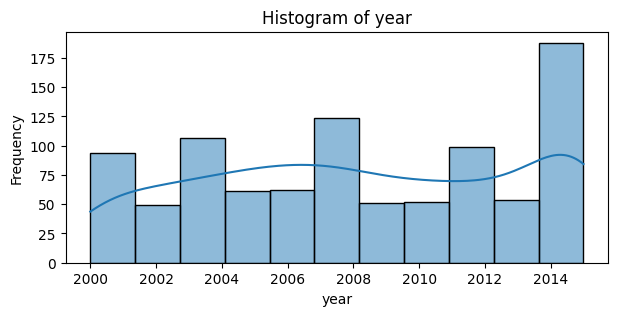

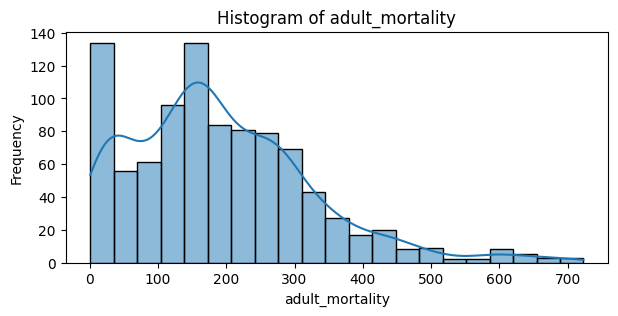

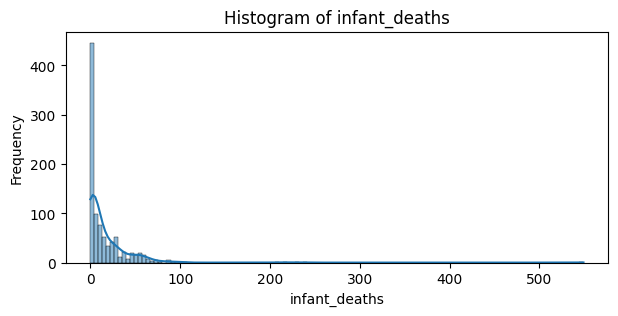

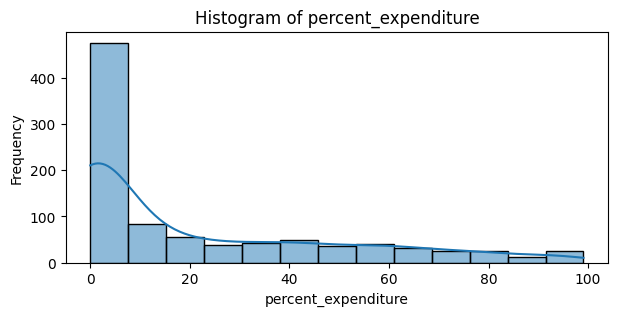

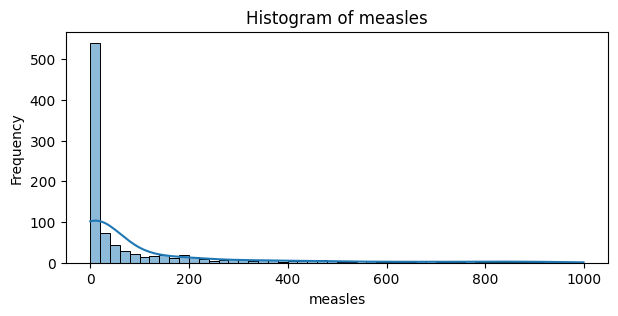

...

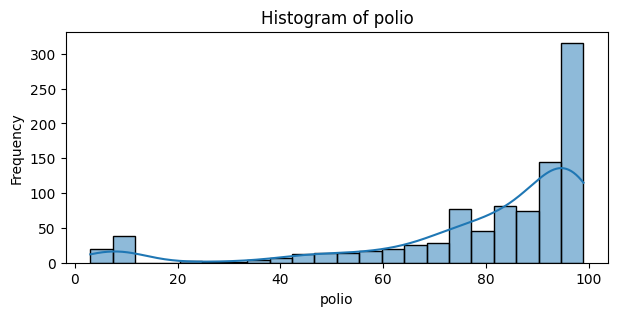

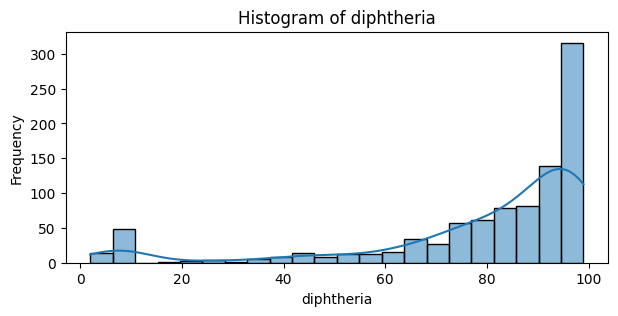

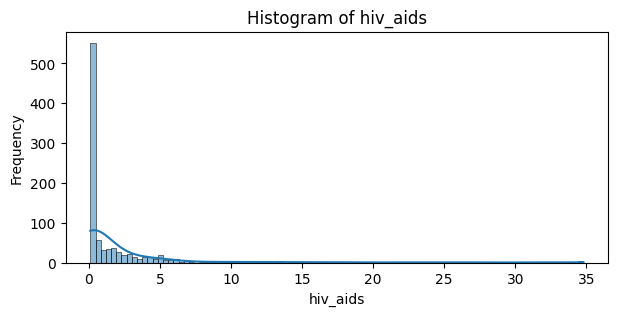

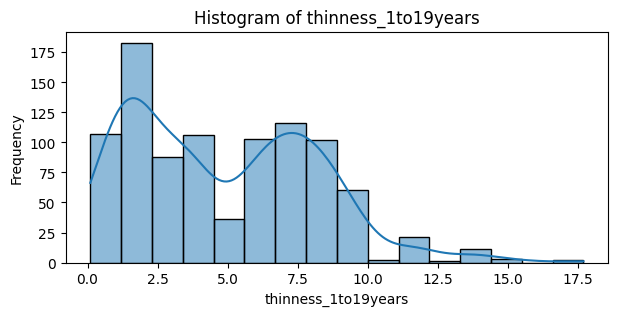

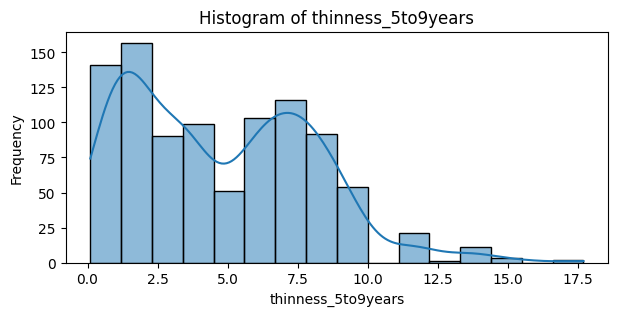

In [372]:
# plot histograms for all numerical features
for column in X.select_dtypes(include=[np.number]).columns:
    plt.figure(figsize=(7, 3))
    sns.histplot(X[column], kde=True)
    plt.title(f'Histogram of {column}')
    plt.xlabel(column)
    plt.ylabel('Frequency')
    plt.show()

### Descriptive Statistics Of Categorical Features

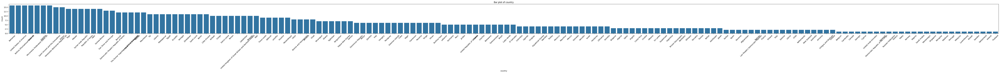

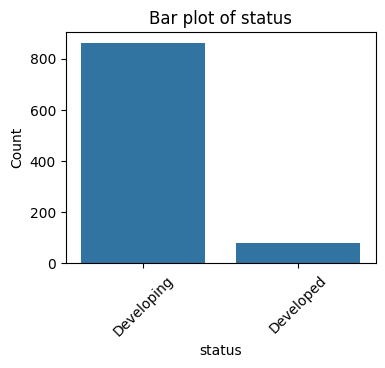

In [373]:
# plot histograms for all categorical features
for column in X.select_dtypes(include=['O']).columns:
    if column == 'country':
        plt.figure(figsize=(100, 3))
    else:
        plt.figure(figsize=(4, 3))
    sns.countplot(x=column, data=X, order=X[column].value_counts().index)
    plt.title(f'Bar plot of {column}')
    plt.xlabel(column)
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.show()

### Descriptive Statistics Of The Target Variable

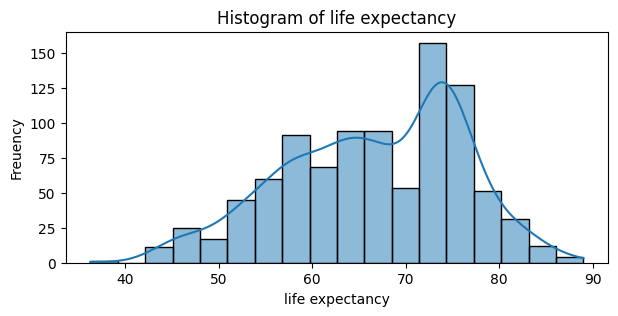

In [374]:
# plot histogram of the target variable
plt.figure(figsize=(7, 3))
sns.histplot(y, kde=True)
plt.title(f'Histogram of life expectancy')
plt.xlabel('life expectancy')
plt.ylabel('Freuency')
plt.show()

### Transforming Categorical Features Into Numerical

In [375]:
# replace country column with latitute and longitude columns
country_coordinates = {
    "Afghanistan": (33.93911, 67.709953),
    "Albania": (41.153332, 20.168331),
    "Algeria": (28.033886, 1.659626),
    "Andorra": (42.546245, 1.601554),
    "Angola": (-11.202692, 17.873887),
    "Antigua and Barbuda": (17.060816, -61.796428),
    "Argentina": (-38.416097, -63.616672),
    "Armenia": (40.069099, 45.038189),
    "Australia": (-25.274398, 133.775136),
    "Austria": (47.516231, 14.550072),
    "Azerbaijan": (40.143105, 47.576927),
    "Bahamas": (25.03428, -77.39628),
    "Bahrain": (26.0667, 50.5577),
    "Bangladesh": (23.685, 90.3563),
    "Barbados": (13.193887, -59.543198),
    "Belarus": (53.709807, 27.953389),
    "Belgium": (50.503887, 4.469936),
    "Belize": (17.189877, -88.49765),
    "Benin": (9.30769, 2.315834),
    "Bhutan": (27.514162, 90.433601),
    "Bolivia (Plurinational State of)": (-16.290154, -63.588653),
    "Bosnia and Herzegovina": (43.915886, 17.679076),
    "Botswana": (-22.328474, 24.684866),
    "Brazil": (-14.235004, -51.92528),
    "Brunei Darussalam": (4.535277, 114.727669),
    "Bulgaria": (42.733883, 25.48583),
    "Burkina Faso": (12.238333, -1.561593),
    "Burundi": (-3.373056, 29.918886),
    "Cabo Verde": (16.002082, -24.013197),
    "Cambodia": (12.565679, 104.990963),
    "Cameroon": (7.369722, 12.354722),
    "Canada": (56.130366, -106.346771),
    "Central African Republic": (6.611111, 20.939444),
    "Chad": (15.454166, 18.732207),
    "Chile": (-35.675147, -71.542969),
    "China": (35.86166, 104.195397),
    "Colombia": (4.570868, -74.297333),
    "Comoros": (-11.6455, 43.3333),
    "Democratic Republic of the Congo": (-0.228021, 15.827659),
    "Costa Rica": (9.748917, -83.753428),
    "Côte d'Ivoire": (7.539989, -5.54708),
    "Croatia": (45.1, 15.2),
    "Cuba": (21.521757, -77.781167),
    "Cyprus": (35.126413, 33.429859),
    "Czechia": (49.817492, 15.472962),
    "Congo": (-4.038333, 21.758664),
    "Denmark": (56.26392, 9.501785),
    "Djibouti": (11.825138, 42.590275),
    "Dominica": (15.414999, -61.370976),
    "Dominican Republic": (18.735693, -70.162651),
    "Ecuador": (-1.831239, -78.183406),
    "Egypt": (26.820553, 30.802498),
    "El Salvador": (13.794185, -88.89653),
    "Equatorial Guinea": (1.650801, 10.267895),
    "Eritrea": (15.179384, 39.782334),
    "Estonia": (58.595272, 25.013607),
    "Swaziland": (-26.522503, 31.465866),
    "Ethiopia": (9.145, 40.489673),
    "Fiji": (-16.578193, 179.414413),
    "Finland": (61.92411, 25.748151),
    "France": (46.227638, 2.213749),
    "Gabon": (-0.803689, 11.609444),
    "Gambia": (13.443182, -15.310139),
    "Georgia": (42.315407, 43.356892),
    "Germany": (51.165691, 10.451526),
    "Ghana": (7.946527, -1.023194),
    "Greece": (39.074208, 21.824312),
    "Grenada": (12.262776, -61.604171),
    "Guatemala": (15.783471, -90.230759),
    "Guinea": (9.945587, -9.696645),
    "Guinea-Bissau": (11.803749, -15.180413),
    "Guyana": (4.860416, -58.93018),
    "Haiti": (18.971187, -72.285215),
    "Honduras": (15.199999, -86.241905),
    "Hungary": (47.162494, 19.503304),
    "Iceland": (64.963051, -19.020835),
    "India": (20.593684, 78.96288),
    "Indonesia": (-0.789275, 113.921327),
    "Iran (Islamic Republic of)": (32.427908, 53.688046),
    "Iraq": (33.223191, 43.679291),
    "Ireland": (53.41291, -8.24389),
    "Israel": (31.046051, 34.851612),
    "Italy": (41.87194, 12.56738),
    "Jamaica": (18.109581, -77.297508),
    "Japan": (36.204824, 138.252924),
    "Jordan": (30.585164, 36.238414),
    "Kazakhstan": (48.019573, 66.923684),
    "Kenya": (-0.023559, 37.906193),
    "Kiribati": (-3.370417, -168.734039),
    "Kuwait": (29.31166, 47.481766),
    "Kyrgyzstan": (41.20438, 74.766098),
    "Lao People's Democratic Republic": (19.85627, 102.495496),
    "Latvia": (56.879635, 24.603189),
    "Lebanon": (33.854721, 35.862285),
    "Lesotho": (-29.609988, 28.233608),
    "Liberia": (6.428055, -9.429499),
    "Libya": (26.3351, 17.228331),
    "Liechtenstein": (47.166, 9.555373),
    "Lithuania": (55.169438, 23.881275),
    "Luxembourg": (49.815273, 6.129583),
    "Madagascar": (-18.766947, 46.869107),
    "Malawi": (-13.254308, 34.301525),
    "Malaysia": (4.210484, 101.975766),
    "Maldives": (3.202778, 73.22068),
    "Mali": (17.570692, -3.996166),
    "Malta": (35.937496, 14.375416),
    "Marshall Islands": (7.131474, 171.184478),
    "Mauritania": (21.00789, -10.940835),
    "Mauritius": (-20.348404, 57.552152),
    "Mexico": (23.634501, -102.552784),
    "Micronesia (Federated States of)": (7.425554, 150.550812),
    "Republic of Moldova": (47.411631, 28.369885),
    "Monaco": (43.750298, 7.412841),
    "Mongolia": (46.862496, 103.846656),
    "Montenegro": (42.708678, 19.37439),
    "Morocco": (31.791702, -7.09262),
    "Mozambique": (-18.665695, 35.529562),
    "Myanmar": (21.913965, 95.956223),
    "Namibia": (-22.95764, 18.49041),
    "Nauru": (-0.522778, 166.931503),
    "Nepal": (28.394857, 84.124008),
    "Netherlands": (52.132633, 5.291266),
    "New Zealand": (-40.900557, 174.885971),
    "Nicaragua": (12.865416, -85.207229),
    "Niger": (17.607789, 8.081666),
    "Nigeria": (9.081999, 8.675277),
    "Democratic People's Republic of Korea": (40.339852, 127.510093),
    "The former Yugoslav republic of Macedonia": (41.608635, 21.745275),
    "Norway": (60.472024, 8.468946),
    "Oman": (21.512583, 55.923255),
    "Pakistan": (30.375321, 69.345116),
    "Palau": (7.51498, 134.58252),
    "Palestine": (31.952162, 35.233154),
    "Panama": (8.537981, -80.782127),
    "Papua New Guinea": (-6.314993, 143.95555),
    "Paraguay": (-23.442503, -58.443832),
    "Peru": (-9.189967, -75.015152),
    "Philippines": (12.879721, 121.774017),
    "Poland": (51.919438, 19.145136),
    "Portugal": (39.399872, -8.224454),
    "Qatar": (25.354826, 51.183884),
    "Romania": (45.943161, 24.96676),
    "Russian Federation": (61.52401, 105.318756),
    "Rwanda": (-1.940278, 29.873888),
    "Saint Kitts and Nevis": (17.357822, -62.782998),
    "Saint Lucia": (13.909444, -60.978893),
    "Saint Vincent and the Grenadines": (12.984305, -61.287228),
    "Samoa": (-13.759029, -172.104629),
    "San Marino": (43.94236, 12.457777),
    "Sao Tome and Principe": (0.18636, 6.613081),
    "Saudi Arabia": (23.885942, 45.079162),
    "Senegal": (14.497401, -14.452362),
    "Serbia": (44.016521, 21.005859),
    "Seychelles": (-4.679574, 55.491977),
    "Sierra Leone": (8.460555, -11.779889),
    "Singapore": (1.352083, 103.819836),
    "Slovakia": (48.669026, 19.699024),
    "Slovenia": (46.151241, 14.995463),
    "Solomon Islands": (-9.64571, 160.156194),
    "Somalia": (5.152149, 46.199616),
    "South Africa": (-30.559482, 22.937506),
    "Republic of Korea": (35.907757, 127.766922),
    "South Sudan": (6.876991, 31.306978),
    "Spain": (40.463667, -3.74922),
    "Sri Lanka": (7.873054, 80.771797),
    "Sudan": (12.862807, 30.217636),
    "Suriname": (3.919305, -56.027783),
    "Sweden": (60.128161, 18.643501),
    "Switzerland": (46.818188, 8.227512),
    "Syrian Arab Republic": (34.802075, 38.996815),
    "Taiwan": (23.69781, 120.960515),
    "Tajikistan": (38.861034, 71.276093),
    "United Republic of Tanzania": (-6.369028, 34.888822),
    "Thailand": (15.870032, 100.992541),
    "Timor-Leste": (-8.874217, 125.727539),
    "Togo": (8.619543, 0.824782),
    "Tonga": (-21.178986, -175.198242),
    "Trinidad and Tobago": (10.691803, -61.222503),
    "Tunisia": (33.886917, 9.537499),
    "Turkey": (38.963745, 35.243322),
    "Turkmenistan": (38.969719, 59.556278),
    "Tuvalu": (-7.109535, 179.220417),
    "Uganda": (1.373333, 32.290275),
    "Ukraine": (48.379433, 31.16558),
    "United Arab Emirates": (23.424076, 53.847818),
    "United Kingdom of Great Britain and Northern Ireland": (55.378051, -3.435973),
    "United States of America": (37.09024, -95.712891),
    "Uruguay": (-32.522779, -55.765835),
    "Uzbekistan": (41.377491, 64.585262),
    "Vanuatu": (-15.376706, 166.959158),
    "Vatican City": (41.902916, 12.453389),
    "Venezuela (Bolivarian Republic of)": (6.42375, -66.58973),
    "Viet Nam": (14.058324, 108.277199),
    "Yemen": (15.552727, 48.516388),
    "Zambia": (-13.133897, 27.849332),
    "Zimbabwe": (-19.015438, 29.154857)
}

# function to get latitude for a country
def get_latitude(country):
    return country_coordinates[country][0]

# function to get longitude for a country
def get_longitude(country):
    return country_coordinates[country][1]

# get longitude for each country
X['latitude'] = X['country'].apply(get_latitude)
X['longitude'] = X['country'].apply(get_longitude)
# drop country column
X.drop('country', axis=1, inplace=True)

In [376]:
# transform the rest of the categorical features to numerical
X = pd.get_dummies(X, drop_first=True)
# verify transformation
X.head()

,year,adult_mortality,infant_deaths,percent_expenditure,measles,bmi,under_five_deaths,polio,diphtheria,hiv_aids,thinness_1to19years,thinness_5to9years,latitude,longitude,status_Developing
1,2014,271.0,64,73.523582,492,18.6,86,58.0,62.0,0.1,17.5,17.5,33.939110,67.709953,1
2,2013,268.0,66,73.219243,430,18.1,89,62.0,64.0,0.1,17.7,17.7,33.939110,67.709953,1
23,2008,1.0,1,36.622068,0,52.6,1,99.0,99.0,0.1,1.6,1.6,41.153332,20.168331,1
26,2005,15.0,1,26.993121,6,49.9,1,97.0,98.0,0.1,1.8,1.8,41.153332,20.168331,1
30,2001,14.0,1,96.205571,18,46.0,1,97.0,97.0,0.1,2.1,2.1,41.153332,20.168331,1


### Clustering & Normalisation & PCA

In [377]:
# Define all scalers that would be considered
scaler_dict = {
    'Standard': StandardScaler(),
    'MinMax': MinMaxScaler(),
    'MaxAbs': MaxAbsScaler()
}

In [378]:
# Initialize variables for tracking best result of clustering
best_silhouette = -1
best_n_clusters = 2
best_model = None
best_scaler = None
best_results = None
cluster_range = range(2, 50)
results = {
    'K-means': {},
    'Hierarchical': {}
}

# Clustering Analysis (loop to find the best combination of a cluster method and a scaler based on silhouette score)
for scaler_name, scaler in scaler_dict.items():
  results['K-means'][scaler_name] = []
  results['Hierarchical'][scaler_name] = []

  # Scale the data
  X_scaled = X.copy()
  cols_to_scale = [col for col in X.columns if col not in ['year', 'latitude', 'longitude','status_Developing']]
  X_scaled[cols_to_scale] = scaler.fit_transform(X[cols_to_scale])

  # K-means Clustering
  for k in cluster_range:

    # fit K-means and track silhouette score
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    labels_kmeans = kmeans.fit_predict(X_scaled)
    score_kmeans = silhouette_score(X_scaled, labels_kmeans)
    results['K-means'][scaler_name].append({'method': 'K-means','n_clusters': k,'score': score_kmeans})
    # determining optimal number of clusters
    if score_kmeans > best_silhouette:
      best_silhouette = score_kmeans
      best_n_clusters = k
      best_model = kmeans
      model_used = 'K-means'
      best_scaler_name = scaler_name
      best_scaler = scaler

    # fit Hierarchical Clustering and track silhouette score
    hc = AgglomerativeClustering(n_clusters=k, linkage='ward')
    labels_hc = hc.fit_predict(X_scaled)
    score_hc = silhouette_score(X_scaled, labels_hc)
    results['Hierarchical'][scaler_name].append({'method': 'ward','n_clusters': k,'score': score_hc})
    # determining optimal number of clusters
    if score_hc > best_silhouette:
      best_silhouette = score_hc
      best_n_clusters = k
      best_model = hc
      model_used = 'Hierarchical'
      best_scaler_name = scaler_name
      best_scaler = scaler

# convert best results to DataFrame
df_results = pd.DataFrame(results[model_used][best_scaler_name])
# print the best results of clustering
print(f"The optimal number of clusters is {best_n_clusters} with a silhouette score of {best_silhouette:.2f}, while using {scaler_name} scaler and {model_used} clustering.")


The optimal number of clusters is 3 with a silhouette score of 0.59, while using MaxAbs scaler and K-means clustering.


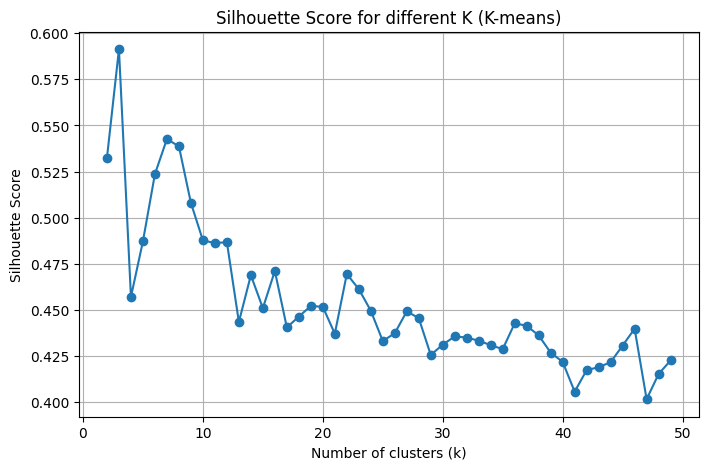

In [379]:
# Plot the silhouette score for different K
plt.figure(figsize=(8, 5))
plt.plot(df_results['n_clusters'], df_results['score'], marker='o')
plt.title(f'Silhouette Score for different K ({model_used})')
plt.xlabel('Number of clusters (k)')
plt.ylabel('Silhouette Score')
plt.grid(True)
plt.show()

In [380]:
# use the best scaling method to scale the data
cols_to_scale = [col for col in X.columns if col not in ['year', 'latitude', 'longitude','status_Developing']]
X[cols_to_scale] = best_scaler.fit_transform(X[cols_to_scale])
# remove redundant data from RAM
X_scaled = None

In [381]:
X.describe()

,year,adult_mortality,infant_deaths,percent_expenditure,measles,bmi,under_five_deaths,polio,diphtheria,hiv_aids,thinness_1to19years,thinness_5to9years,latitude,longitude,status_Developing
count,941.000000,941.000000,941.000000,941.000000,941.000000,941.000000,941.000000,941.000000,941.000000,941.000000,941.000000,941.000000,941.000000,941.000000,941.000000
mean,2008.184910,0.264414,0.028559,0.217673,0.102354,0.464847,0.025834,0.811988,0.805376,0.059386,0.275083,0.267986,12.526121,6.513637,0.914984
std,4.781817,0.184008,0.053364,0.278555,0.199544,0.251559,0.051404,0.236776,0.246558,0.138948,0.187268,0.186130,20.971861,68.592542,0.279054
min,2000.000000,0.001383,0.000000,0.000000,0.000000,0.025773,0.000000,0.030303,0.020202,0.002874,0.005650,0.005650,-40.900557,-175.198242,0.000000
25%,2004.000000,0.131397,0.001821,0.000000,0.000000,0.251289,0.001138,0.747475,0.747475,0.002874,0.101695,0.096045,-1.831239,-56.027783,1.000000
50%,2008.000000,0.236515,0.010929,0.075623,0.008008,0.427835,0.009101,0.898990,0.898990,0.005747,0.237288,0.231638,12.238333,14.995463,1.000000
75%,2013.000000,0.370678,0.041894,0.399237,0.099099,0.697165,0.035267,0.969697,0.969697,0.054598,0.418079,0.412429,26.335100,38.996815,1.000000
max,2015.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,64.963051,179.414413,1.000000


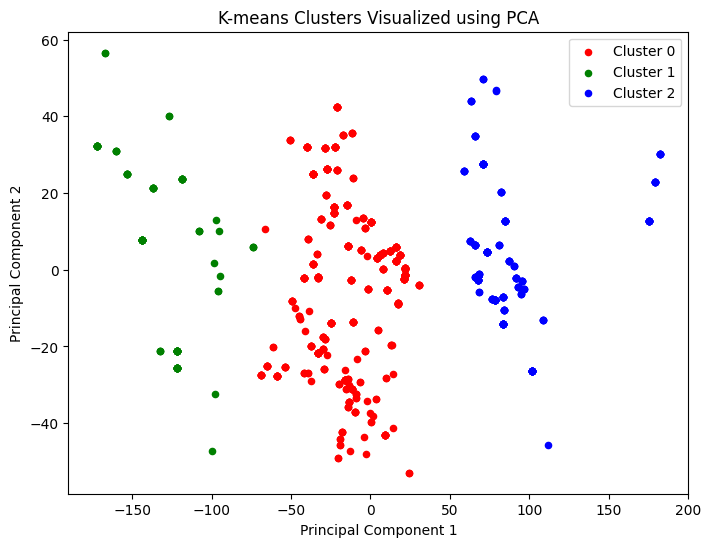

In [382]:
# perform PCA to reduce the data to 2 dimensions for visualization
pca = PCA(n_components=2, random_state=42)  
X_pca = pca.fit_transform(X) 
cluster_labels = best_model.labels_ 

# create a figure to visualise the clusters
plt.figure(figsize=(8, 6))
colors = ['red', 'green', 'blue']
for cluster in range(best_n_clusters):
    plt.scatter(X_pca[cluster_labels == cluster, 0],
                X_pca[cluster_labels == cluster, 1],
                color=colors[cluster],
                label=f'Cluster {cluster}',
                marker='o', s=20)
plt.title(f'{model_used} Clusters Visualized using PCA')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend()
plt.show()

### Feature Relations (All by All Features)

In [383]:
# get features names (will be used for different plots)
features = X.columns

In [384]:
# create a grid of subplots with dimensions based on the number of features
fig, axes = plt.subplots(len(features), len(features), figsize=(100, 100))
for i in range(len(features)):
  for j in range(len(features)):
    if i != j: # checking if the current subplot is not on the diagonal
      # get scatter plot of the data points for the i-th and j-th features
      axes[i, j].scatter(X.iloc[:, i], X.iloc[:, j], c=labels_kmeans, cmap='viridis', s=10)
      axes[i, j].set_xlabel(features[i])
      axes[i, j].set_ylabel(features[j])
      axes[i, j].set_title(f'{features[i]} vs {features[j]}')
    else:
      # turn off the axis for the diagonal subplots
      axes[i, j].axis('off')
# adjust layout so as to prevent overlap
plt.tight_layout()
plt.show()

### Features Assosiations (All By All Features)

In [385]:
# convert to numpy arrays
X = X.to_numpy().astype(np.float32)
y = y.to_numpy().astype(np.float32)

In [386]:
# for plotting numeric vs numeric data
def plot_numeric_numeric(xx, yy, xx_name, yy_name, plot_figure=False):
    # sort data based on xx values
    iso = np.argsort(xx)
    xx = xx[iso]
    yy = yy[iso]

    # fit a linear regression model
    model = LinearRegression()
    model.fit(xx.reshape(-1, 1), yy)
    y_pred = model.predict(xx.reshape(-1, 1))

    # compute Pearson correlation coefficient
    pearson_corr, _ = pearsonr(xx, yy)

    if plot_figure:
        # keep only 1000 equally spaced points - used for plotting
        xx = xx[::len(xx)//1000]
        yy = yy[::len(yy)//1000]
        y_pred = y_pred[::len(y_pred)//1000]

        # compute R-squared value
        r_squared = model.score(xx.reshape(-1, 1), yy)

        # create the plot
        plot_title = f"Pearson Correlation={pearson_corr:.5f}, R-Squared={r_squared:.5f}, "
        print(plot_title + f"{yy_name}={model.coef_[0]:.2f}({xx_name})+{model.intercept_:.2f}")

        fig = go.Figure()
        fig.add_trace(go.Scatter(x=xx, y=yy, mode='markers', name=f'Given Data Points of {xx_name} vs {yy_name}'))
        fig.add_trace(go.Scatter(x=xx, y=y_pred, mode='lines+markers', name='Trend Line', marker=dict(color='grey')))

        # update the layout of the figure
        fig.update_layout(title=plot_title, xaxis_title=xx_name, yaxis_title=yy_name, template='plotly_white',
                          legend=dict(yanchor="top", y=1.05, xanchor="left", x=0.01), width=500, height=400, font=dict(size=10))
        fig.show()

    return pearson_corr

In [387]:
# for plotting numeric vs categorical data
def plot_numeric_categorical(xx, yy, xx_name, yy_name, plot_figure=False):
    # sort data based on xx values
    iso = np.argsort(xx)
    xx = xx[iso]
    yy = yy[iso]

    # fit a logistic regression model
    model = LogisticRegression()
    model.fit(xx.reshape(-1, 1), yy)

    # get predictions and probabilities for the binary
    y_pred = model.predict(xx.reshape(-1, 1))
    y_pred_proba = model.predict_proba(xx.reshape(-1, 1))[:, 1]

    # compute F1 score
    accuracy1 = f1_score(yy, y_pred)

    if plot_figure:
        # keep only 1000 equally spaced points - used for plotting
        xx = xx[::len(xx)//1000]
        yy = yy[::len(yy)//1000]
        y_pred_proba = y_pred_proba[::len(y_pred_proba)//1000]
        y_pred = y_pred[::len(y_pred)//1000]

        # create the plot
        plot_title = f"F1 Score={accuracy1:.2f}, Accuracy={accuracy_score(yy, y_pred):.2f}, AUC={roc_auc_score(yy, y_pred_proba):.2f}"
        print(plot_title + f", {yy_name}=1/(1+exp(-({model.coef_[0][0]:.2f}({xx_name}) + {model.intercept_[0]:.2f})))")

        fig = go.Figure()
        fig.add_trace(go.Scatter(x=xx, y=yy, mode='markers', name='Given Data Points'))
        fig.add_trace(go.Scatter(x=xx, y=y_pred_proba, mode='lines+markers', name='Logistic Regression Predictions',
                        marker=dict(color='grey')))
        fig.add_trace(go.Scatter(x=xx, y=y_pred, mode='markers', name='Logistic Regression Predictions (binary)'))

        # update the layout of the figure
        fig.update_layout(title=plot_title, xaxis_title=xx_name, yaxis_title=yy_name, template='plotly_white', width=500, height=400, font=dict(size=10))
        fig.show()

    return accuracy1

In [388]:

def plot_categorical_numeric(xx, yy, xx_name, yy_name, plot_figure=False):
    groups_anova = [yy[xx == groupAnv] for groupAnv in np.unique(xx)]  # Split yy by xx groups
    ss_total = np.sum((yy - np.mean(yy)) ** 2)  # Total sum of squares
    ss_between = np.sum([len(groupAnv) * (np.mean(groupAnv) - np.mean(yy)) ** 2 for groupAnv in groups_anova])  # between-group sum of squares

    anova_eta_squared = ss_between / ss_total
    if plot_figure:
        # get unique classes
        unique_classes = np.unique(xx)

        # plot histogram
        my_title = f"Histograms of {yy_name} for each class of {xx_name}"
        print(my_title + f", Eta Squared={anova_eta_squared:.2f}")

        fig = go.Figure()

        for cls in unique_classes:
            fig.add_trace(go.Histogram(x=yy[xx == cls], name=f'{xx_name}={cls}', opacity=0.75))

        fig.update_layout(barmode='overlay', title=my_title,
                          xaxis_title=yy_name, yaxis_title='Count', template='plotly_white', width=500, height=400, font=dict(size=10))

        fig.show()

    return anova_eta_squared

In [389]:
# distinguish between categorical and numerical features
is_feature_categorical = []  
for i in range(X.shape[1]):  
    if np.unique(X[:, i]).size > 2:
        is_feature_categorical.append(False) 
    else:
        is_feature_categorical.append(True)

In [390]:
# initialize lists to store different types of correlations
all_numeric_numeric_correlations = []
all_numeric_categorical_correlations = []
all_categorical_categorical_correlations = []
all_categorical_numeric_correlations = []

# iterate over each feature pair in the dataset
all_by_all_associations = np.zeros((X.shape[1], X.shape[1]))
for i in range(X.shape[1]):
    for j in range(X.shape[1]):
        if i != j:  # ensure we are not comparing the same feature
            # check if both features are numeric
            if not is_feature_categorical[i] and not is_feature_categorical[j]:
                pearson_corr = plot_numeric_numeric(X[:, i], X[:, j], features[i], features[j], plot_figure=False)
                all_numeric_numeric_correlations.append((i, j, pearson_corr))
                all_by_all_associations[i, j] = pearson_corr
            # check if the first feature is numeric and the second is categorical
            elif not is_feature_categorical[i] and is_feature_categorical[j]:
                anova_eta_squared = plot_numeric_categorical(X[:, i], X[:, j], features[i], features[j], plot_figure=False)
                all_numeric_categorical_correlations.append((i, j, anova_eta_squared))
                all_by_all_associations[i, j] = anova_eta_squared
            # check if the first feature is categorical and the second is numeric
            elif is_feature_categorical[i] and not is_feature_categorical[j]:
                anova_eta_squared = plot_categorical_numeric(X[:, i], X[:, j], features[i], features[j], plot_figure=False)
                all_categorical_numeric_correlations.append((i, j, anova_eta_squared))
                all_by_all_associations[i, j] = anova_eta_squared

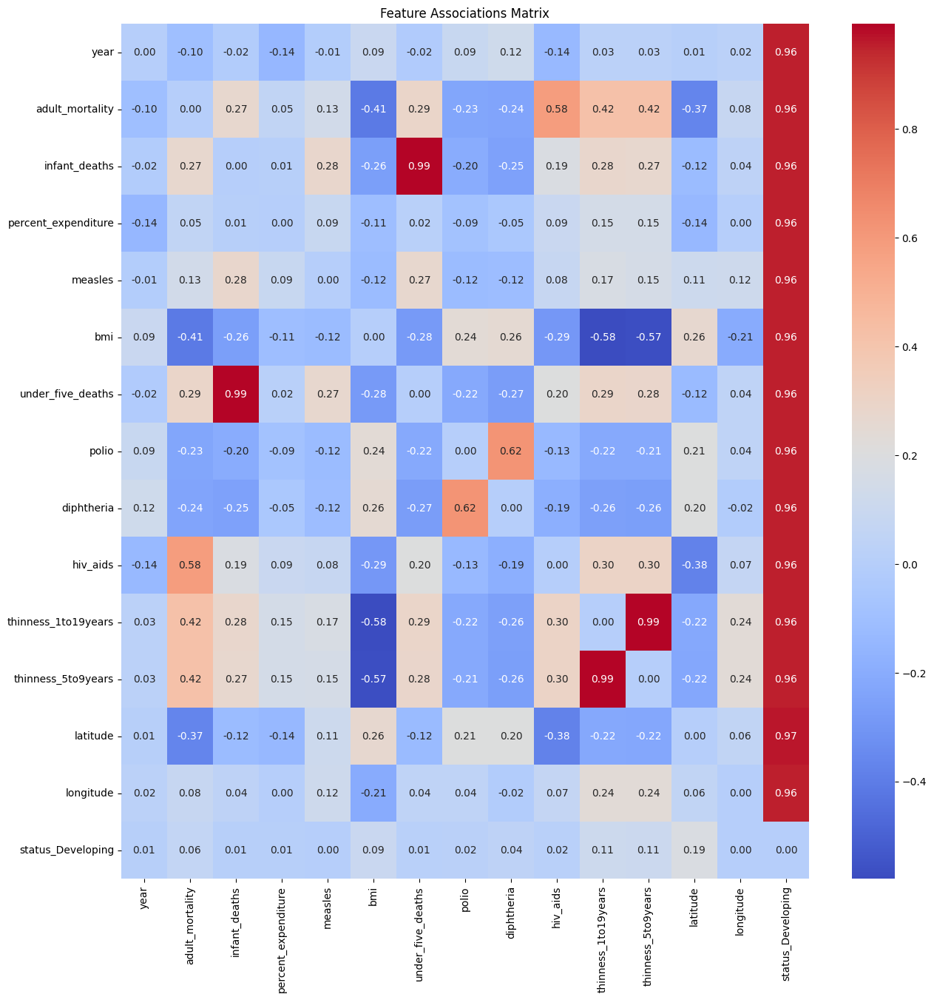

In [391]:
# plot the feature associations matrix
plt.figure(figsize=(15, 15))
sns.heatmap(all_by_all_associations, annot=True, fmt=".2f", cmap="coolwarm", xticklabels=features, yticklabels=features)
plt.title("Feature Associations Matrix")
plt.show()

### Features Assosiations to The Target Variable

In [392]:
# Initialize lists to store different types of correlations
all_numeric_numeric_correlations = []
all_numeric_categorical_correlations = []
all_categorical_categorical_correlations = []
all_categorical_numeric_correlations = []

# Iterate over each feature pair in the dataset
features_by_target = np.zeros((X.shape[1], 1))
for i in range(X.shape[1]):
    # Check if both features are numeric
    if not is_feature_categorical[i]:
        pearson_corr = plot_numeric_numeric(X[:, i], y[:], features[i], "life_expectancy", plot_figure=False)
        all_numeric_numeric_correlations.append((i, 0, pearson_corr))
        features_by_target[i, 0] = pearson_corr

    # Check if the first feature is categorical
    elif is_feature_categorical[i]:
        anova_eta_squared = plot_categorical_numeric(X[:, i], y[:], features[i], "life_expectancy", plot_figure=False)
        all_categorical_numeric_correlations.append((i, 0, anova_eta_squared))
        features_by_target[i, 0] = anova_eta_squared

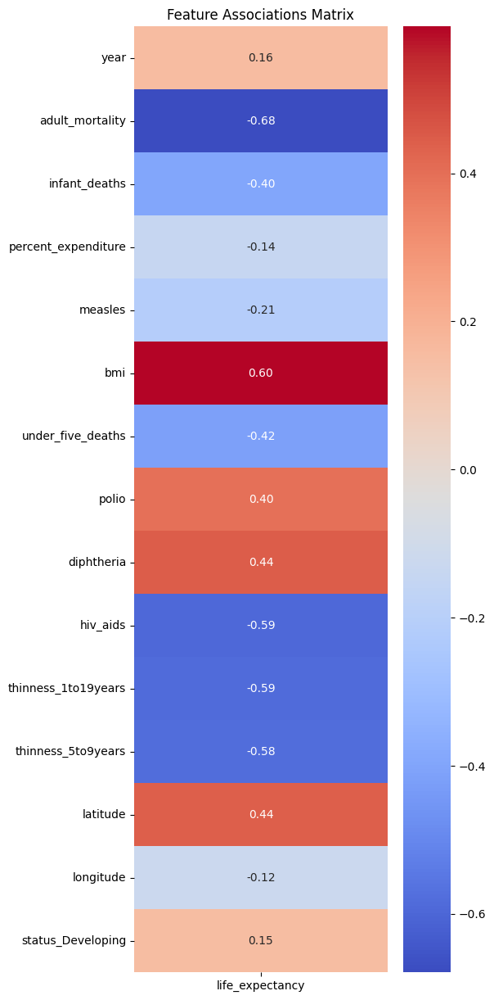

In [393]:
plt.figure(figsize=(5, 15))
sns.heatmap(features_by_target, annot=True, fmt=".2f", cmap="coolwarm", xticklabels=["life_expectancy"], yticklabels=features)
plt.title("Feature Associations Matrix")
plt.show()

### Buiding The Models

Linear Regression

In [394]:
X = pd.DataFrame(X)
# Add a constant term to the features on the left
X = sm.add_constant(X)
X.head()


,const,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14
0,1.0,2014.0,0.374827,0.116576,0.742056,0.492492,0.239691,0.097838,0.585859,0.626263,0.002874,0.988701,0.988701,33.939110,67.709953,1.0
1,1.0,2013.0,0.370678,0.120219,0.738984,0.430430,0.233247,0.101251,0.626263,0.646465,0.002874,1.000000,1.000000,33.939110,67.709953,1.0
2,1.0,2008.0,0.001383,0.001821,0.369618,0.000000,0.677835,0.001138,1.000000,1.000000,0.002874,0.090395,0.090395,41.153332,20.168331,1.0
3,1.0,2005.0,0.020747,0.001821,0.272435,0.006006,0.643041,0.001138,0.979798,0.989899,0.002874,0.101695,0.101695,41.153332,20.168331,1.0
4,1.0,2001.0,0.019364,0.001821,0.970979,0.018018,0.592784,0.001138,0.979798,0.979798,0.002874,0.118644,0.118644,41.153332,20.168331,1.0


In [395]:
# split the dataset into training and testing sets with a 70-30 split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [396]:
# display the shape of the training and testing sets
print("Training features shape:", X_train.shape)
print("Training target shape:", y_train.shape)
print("\n")
print("Testing features shape:", X_test.shape)
print("Testing target shape:", y_test.shape)

Training features shape: (658, 16)
Training target shape: (658,)


Testing features shape: (283, 16)
Testing target shape: (283,)


In [397]:
# calulate the start time of the training
start_time = time.time()

# fit the linear regression model using statsmodels
model = sm.OLS(y_train, X_train).fit()

# calculate the end time of the training
end_time = time.time()
time_train_LR = end_time - start_time

Train Dataset

In [398]:
# predict on training data
Ytr_pred = model.predict(X_train)

# calculate metrics for training data
r2_train = r2_score(y_train, Ytr_pred)
mse_train = mean_squared_error(y_train, Ytr_pred)
mae_train = mean_absolute_error(y_train, Ytr_pred)
rmse_train = np.sqrt(mse_train)

# print metrics
print("Training Set Metrics:")
print(f"R² Score: {r2_train:.4f}")
print(f"Mean Absolute Error: {mae_train:.4f}")
print(f"Mean Squared Error: {mse_train:.4f}")
print(f"Root Mean Squared Error: {rmse_train:.4f}")

Training Set Metrics:
R² Score: 0.7541
Mean Absolute Error: 3.6232
Mean Squared Error: 22.6187
Root Mean Squared Error: 4.7559


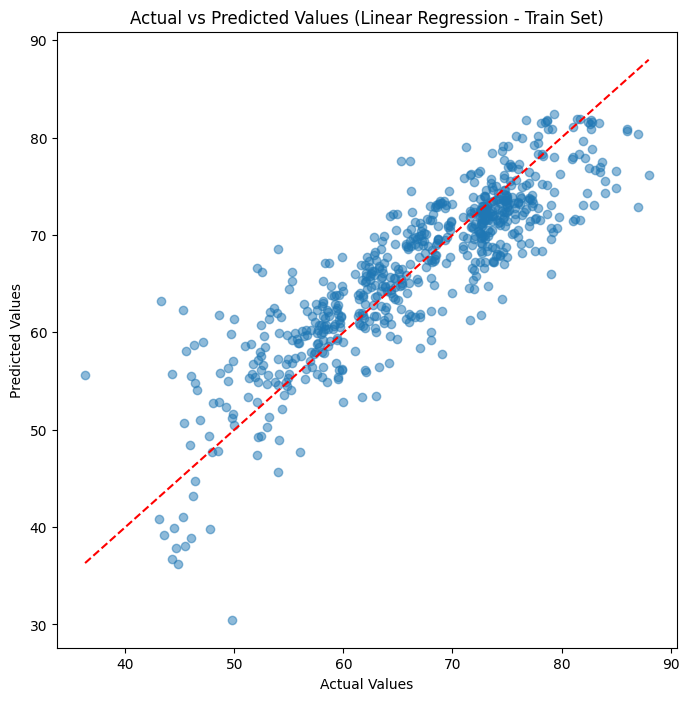

In [399]:
# plot actual vs predicted data for the training set
plt.figure(figsize=(8, 8))
plt.scatter(y_train, Ytr_pred, alpha=0.5)
plt.plot([y_train.min(), y_train.max()], [y_train.min(), y_train.max()], 'r--')
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.title("Actual vs Predicted Values (Linear Regression - Train Set)")
plt.show()

Test dataset

In [400]:
# predict on testing data
Yte_pred = model.predict(X_test)

# calculate metrics for testing data
r2_test = r2_score(y_test, Yte_pred)
mse_test = mean_squared_error(y_test, Yte_pred)
mae_test = mean_absolute_error(y_test, Yte_pred)
rmse_test = np.sqrt(mse_test)

# print metrics
print("Test Set Metrics:")
print(f"R² Score: {r2_test:.4f}")
print(f"Mean Absolute Error: {mae_test:.4f}")
print(f"Mean Squared Error: {mse_test:.4f}")
print(f"Root Mean Squared Error: {rmse_test:.4f}")

Test Set Metrics:
R² Score: 0.7296
Mean Absolute Error: 3.7398
Mean Squared Error: 23.2025
Root Mean Squared Error: 4.8169


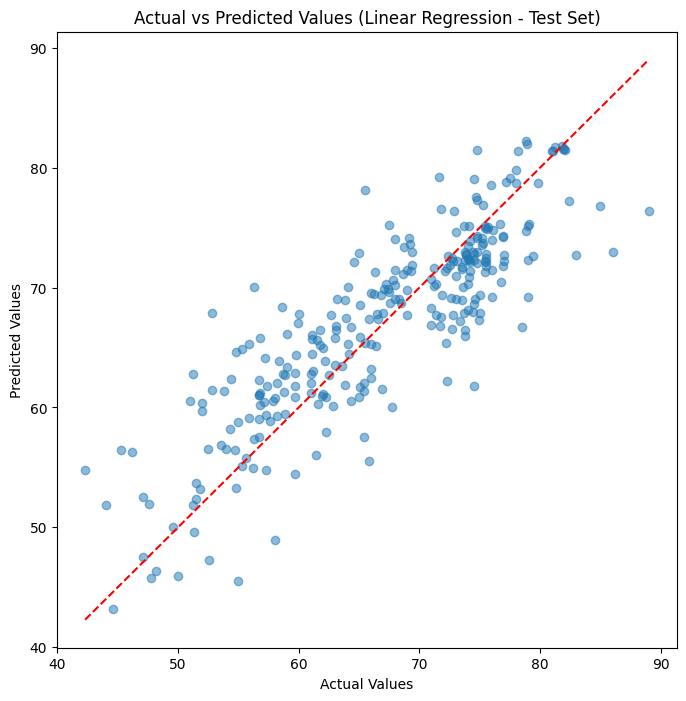

In [401]:
#plot actual vs predicted data for test set
plt.figure(figsize=(8, 8))
plt.scatter(y_test, Yte_pred, alpha=0.5)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.title("Actual vs Predicted Values (Linear Regression - Test Set)")
plt.show()

In [402]:
print(f"Time taken to train the model: {time_train_LR:.5f} seconds")
start = time.time()
for i in range(X_test.shape[0]):
    model.predict(X_test[:i])
end = time.time()
avg_inference_time = (end - start) / X_test.shape[0]
print(f"Average inference time per sample: {avg_inference_time:.5f} seconds")

Time taken to train the model: 0.00191 seconds
Average inference time per sample: 0.00007 seconds


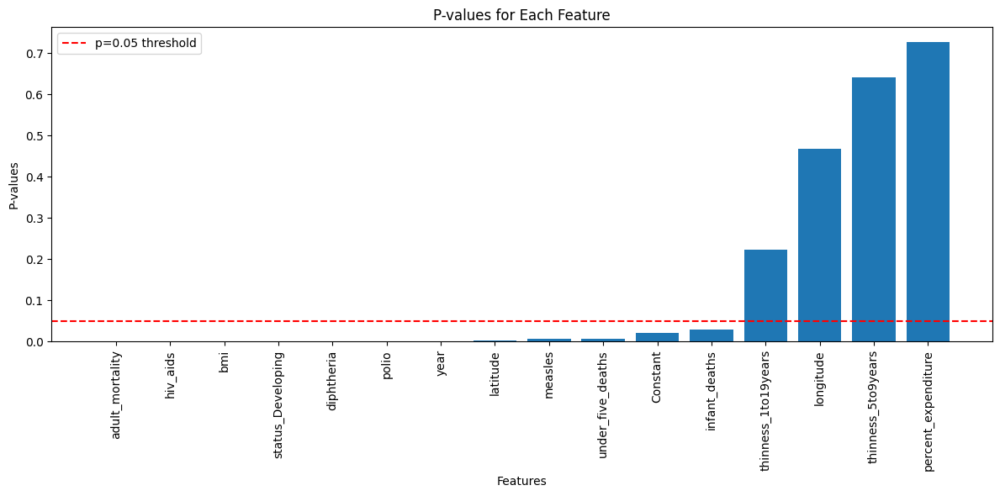

In [403]:
# get the p-values
p_vals = model.pvalues
# Create a dataframe with feature names and p-values for easier sorting
p_values_df = pd.DataFrame({'Feature': features.insert(0, 'Constant'), 'P_value': p_vals})
# Sort by p-values in ascending order
p_values_df = p_values_df.sort_values('P_value')
# plot p-values for each feature in ascending order
plt.figure(figsize=(12, 6))
plt.bar(p_values_df['Feature'], p_values_df['P_value'])
plt.xlabel('Features')
plt.ylabel('P-values')
plt.title('P-values for Each Feature')
plt.xticks(rotation=90)  # better readability
plt.axhline(y=0.05, color='r', linestyle='--', label='p=0.05 threshold')
plt.legend()
plt.tight_layout()
plt.show()

In [405]:
# drop constant variable before implementing next models
X = X.drop('const', axis=1)
X.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14
0,2014.0,0.374827,0.116576,0.742056,0.492492,0.239691,0.097838,0.585859,0.626263,0.002874,0.988701,0.988701,33.939110,67.709953,1.0
1,2013.0,0.370678,0.120219,0.738984,0.430430,0.233247,0.101251,0.626263,0.646465,0.002874,1.000000,1.000000,33.939110,67.709953,1.0
2,2008.0,0.001383,0.001821,0.369618,0.000000,0.677835,0.001138,1.000000,1.000000,0.002874,0.090395,0.090395,41.153332,20.168331,1.0
3,2005.0,0.020747,0.001821,0.272435,0.006006,0.643041,0.001138,0.979798,0.989899,0.002874,0.101695,0.101695,41.153332,20.168331,1.0
4,2001.0,0.019364,0.001821,0.970979,0.018018,0.592784,0.001138,0.979798,0.979798,0.002874,0.118644,0.118644,41.153332,20.168331,1.0


### Decision Regression Tree

In [406]:
# split the dataset into training and testing sets with a 70-30 split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# checking shapes
print("Training features shape:", X_train.shape)
print("Testing features shape:", X_test.shape)
print("Training target shape:", y_train.shape)
print("Testing target shape:", y_test.shape)

Training features shape: (658, 15)
Testing features shape: (283, 15)
Training target shape: (658,)
Testing target shape: (283,)


In [407]:
# Define parameter grid
param_grid = {
    'max_depth': [3, 5, 7, 10, 15, 20, 25, 30],
    'min_samples_leaf': [5, 10, 20, 50],
    'ccp_alpha': [0.001, 0.01, 0.1, 0.5],
    'criterion': ['squared_error', 'absolute_error', 'friedman_mse']
}

# Create model
base_model = DecisionTreeRegressor(random_state=42)

# Create grid search with cross-validation
grid_search = GridSearchCV(
    estimator=base_model,
    param_grid=param_grid,
    cv=5,  # 5-fold cross-validation
    scoring='r2',
)

time_start = time.time()
# Fit grid search to training data
grid_search.fit(X_train, y_train)
time_end = time.time()
# calculate the time taken
time_train_DT = time_end - time_start

# Get best parameters and model
best_params = grid_search.best_params_
best_model = grid_search.best_estimator_
best_cv_score = grid_search.best_score_

# Print results
print(f"Best Parameters: {best_params}")
print(f"Best Cross-Validation R² Score: {best_cv_score:.4f}")

Best Parameters: {'ccp_alpha': 0.01, 'criterion': 'squared_error', 'max_depth': 15, 'min_samples_leaf': 5}
Best Cross-Validation R² Score: 0.8808


TRAINING SET

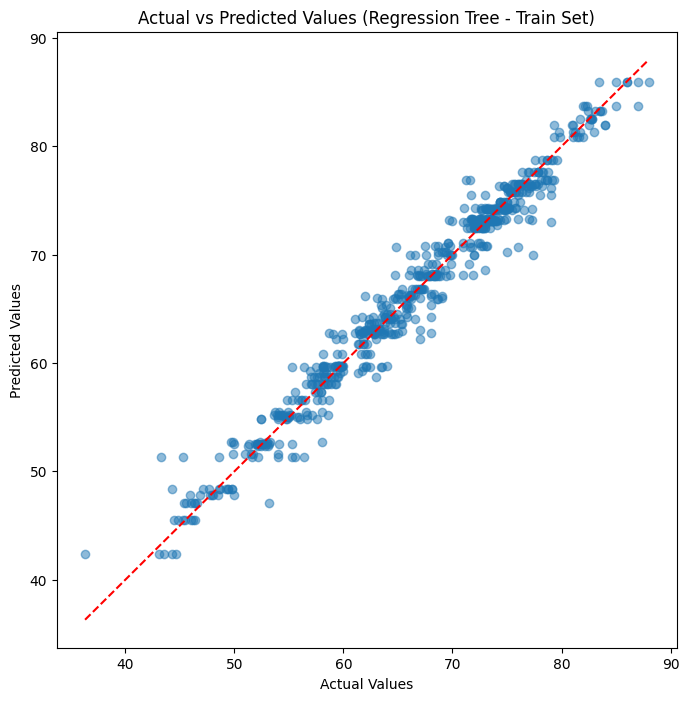

Training Set Metrics:
R² Score: 0.9709
Mean Absolute Error: 1.1362
Mean Squared Error: 2.6795
Root Mean Squared Error: 1.6369


In [408]:
pred_tr = best_model.predict(X_train)
# Calculate metrics for training data
r2_train = r2_score(y_train, pred_tr)
mse_train = mean_squared_error(y_train, pred_tr)
mae_train = mean_absolute_error(y_train, pred_tr)
rmse_train = np.sqrt(mse_train)

#plot actual vs predicted data for test set
plt.figure(figsize=(8, 8))
plt.scatter(y_train, pred_tr, alpha=0.5)
plt.plot([y_train.min(), y_train.max()], [y_train.min(), y_train.max()], 'r--')
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.title("Actual vs Predicted Values (Regression Tree - Train Set)")
plt.show()

# Print metrics
print("Training Set Metrics:")
print(f"R² Score: {r2_train:.4f}")
print(f"Mean Absolute Error: {mae_train:.4f}")
print(f"Mean Squared Error: {mse_train:.4f}")
print(f"Root Mean Squared Error: {rmse_train:.4f}")

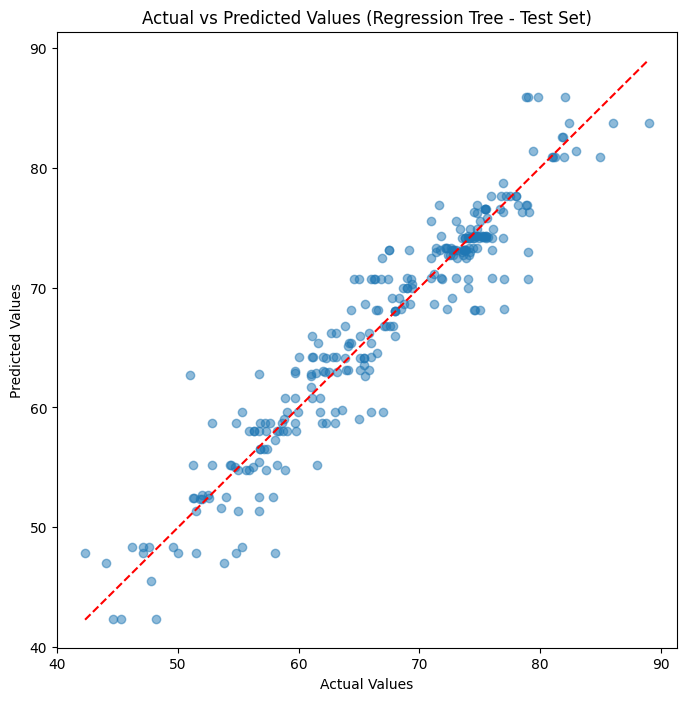

Test Set Metrics:
R² Score: 0.9019
Mean Absolute Error: 2.0676
Mean Squared Error: 8.4215
Root Mean Squared Error: 2.9020


In [409]:
time_start = time.time()
pred_te = best_model.predict(X_test)
time_end = time.time()
# calculate the time taken
time_test_DT = time_end - time_start
# calculate metrics for testing data   
r2_test = r2_score(y_test, pred_te)
mse_test = mean_squared_error(y_test, pred_te)
mae_test = mean_absolute_error(y_test, pred_te)
rmse_test = np.sqrt(mse_test)

#plot actual vs predicted data for test set
plt.figure(figsize=(8, 8))
plt.scatter(y_test, pred_te, alpha=0.5)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.title("Actual vs Predicted Values (Regression Tree - Test Set)")
plt.show()

# Print metrics
print("Test Set Metrics:")
print(f"R² Score: {r2_test:.4f}")
print(f"Mean Absolute Error: {mae_test:.4f}")
print(f"Mean Squared Error: {mse_test:.4f}")
print(f"Root Mean Squared Error: {rmse_test:.4f}")

In [410]:
print(f"Time taken to train the model: {time_train_DT:.4f} seconds")
print(f"Time taken to test the model: {time_test_DT:.4f} seconds")
start = time.time()
for i in range(X_test.shape[0]):
    best_model.predict(X_test.iloc[i].values.reshape(1, -1))
end = time.time()
avg_inference_time = (end - start) / X_test.shape[0]
print(f"Average inference time per sample: {avg_inference_time:.5f} seconds")

Time taken to train the model: 15.3217 seconds
Time taken to test the model: 0.0009 seconds
Average inference time per sample: 0.00005 seconds


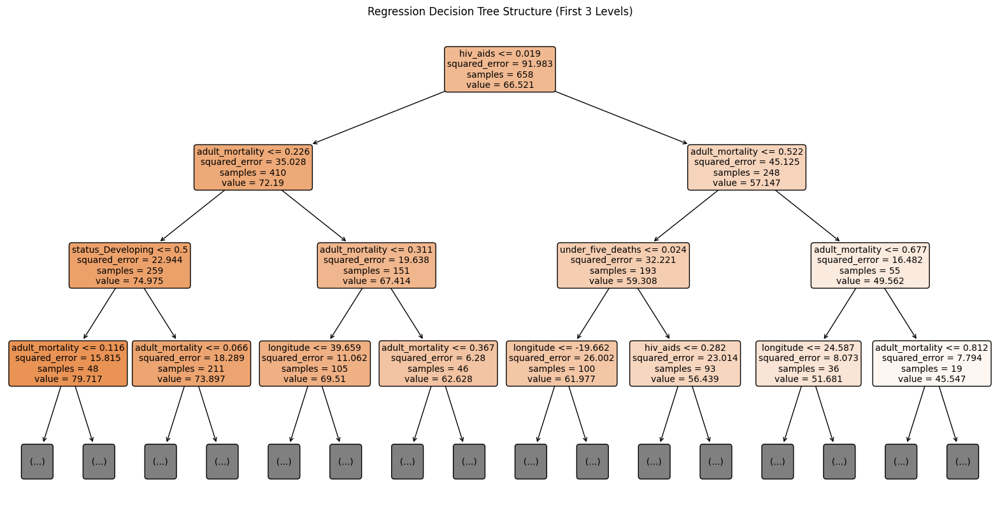

In [ ]:
plt.figure(figsize=(20, 10))
plot_tree(
    best_model,
    feature_names=features,  #feature names??
    filled=True,
    rounded=True,
    max_depth=3,  # Limit depth for readability
    fontsize=10,
)
plt.title("Regression Decision Tree Structure (First 3 Levels)")
plt.show()

### Random Forest

In [412]:
# split the dataset into training and testing sets with a 70-30 split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# checking shapes
print("Training features shape:", X_train.shape)
print("Testing features shape:", X_test.shape)
print("Training target shape:", y_train.shape)
print("Testing target shape:", y_test.shape)

Training features shape: (658, 15)
Testing features shape: (283, 15)
Training target shape: (658,)
Testing target shape: (283,)


In [413]:
# Define parameter grid specific to random forests
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_features': ['sqrt', 'log2', 0.33, 0.5],
    'min_samples_split': [2, 5, 10],
    'bootstrap': [True, False],
    'max_depth': [best_params['max_depth']],  # Use the best from decision tree
    'min_samples_leaf': [best_params['min_samples_leaf']],  # Use the best from decision tree
    'criterion': [best_params['criterion']]  # Use the best from decision tree
}

# Create model
base_model = RandomForestRegressor(random_state=42)

# Create grid search
rf_grid = GridSearchCV(
    estimator=base_model,
    param_grid=param_grid,
    scoring='r2',
    cv=5
)

# Start time for training
time_start = time.time()
# Fit grid search
rf_grid.fit(X_train, y_train)
# End time for training
time_end = time.time()
# calculate the time taken
time_train_RF = time_end - time_start

# Get best model
best_rf_model = rf_grid.best_estimator_
best_rf_params = rf_grid.best_params_

print(f"Best Random Forest Parameters: {best_rf_params}")

Best Random Forest Parameters: {'bootstrap': False, 'criterion': 'squared_error', 'max_depth': 15, 'max_features': 0.5, 'min_samples_leaf': 5, 'min_samples_split': 2, 'n_estimators': 200}


TRAINING SET

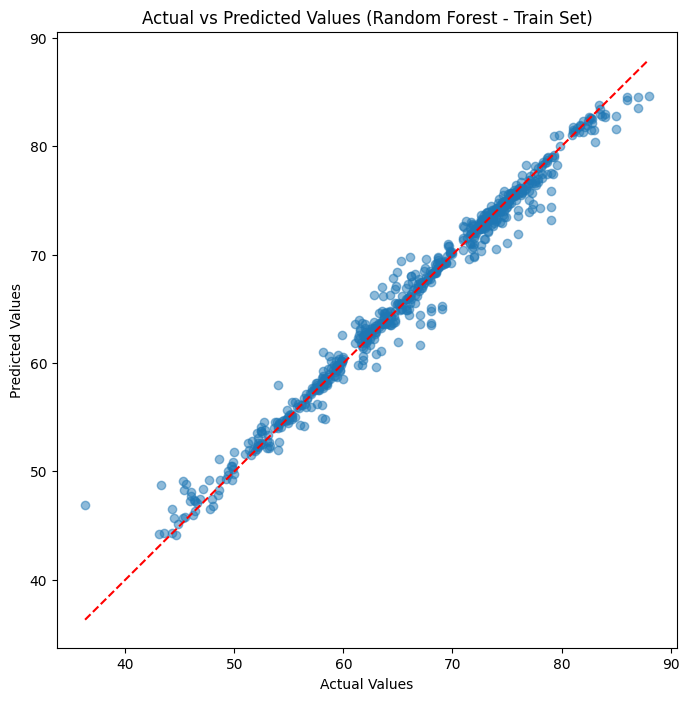

Training Set Metrics:
R² Score: 0.9828
Mean Absolute Error: 0.7720
Mean Squared Error: 1.5817
Root Mean Squared Error: 1.2577


In [414]:
# predict on train data
rf_pred_train = best_rf_model.predict(X_train)

# Calculate metrics for training data
r2_train = r2_score(y_train, rf_pred_train)
mse_train = mean_squared_error(y_train, rf_pred_train)
mae_train = mean_absolute_error(y_train, rf_pred_train)
rmse_train = np.sqrt(mse_train)

#plot actual vs predicted data for test set
plt.figure(figsize=(8, 8))
plt.scatter(y_train, rf_pred_train, alpha=0.5)
plt.plot([y_train.min(), y_train.max()], [y_train.min(), y_train.max()], 'r--')
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.title("Actual vs Predicted Values (Random Forest - Train Set)")
plt.show()

# Print metrics
print("Training Set Metrics:")
print(f"R² Score: {r2_train:.4f}")
print(f"Mean Absolute Error: {mae_train:.4f}")
print(f"Mean Squared Error: {mse_train:.4f}")
print(f"Root Mean Squared Error: {rmse_train:.4f}")



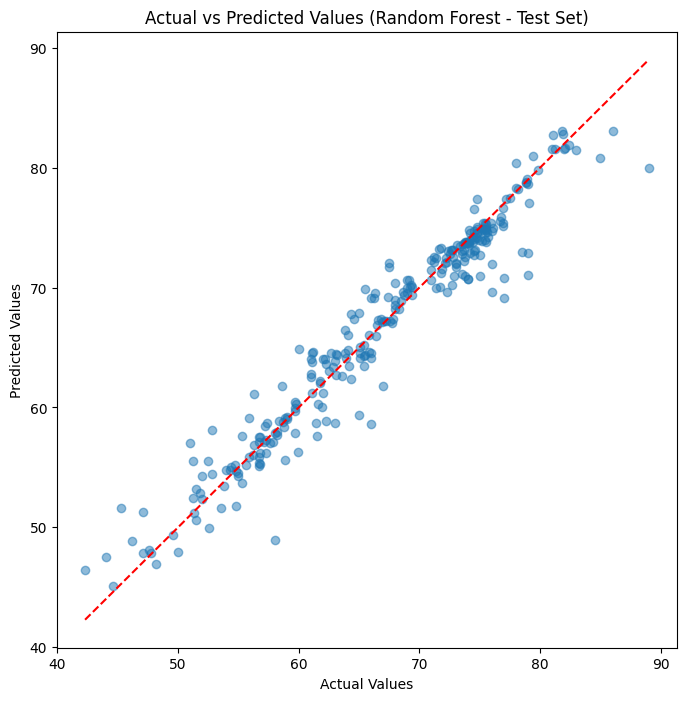

Test Set Metrics:
R² Score: 0.9423
Mean Absolute Error: 1.4819
Mean Squared Error: 4.9547
Root Mean Squared Error: 2.2259


In [415]:
time_start = time.time()
# predict on test data
rf_pred_test = best_rf_model.predict(X_test)
# End time for testing
time_end = time.time()
# calculate the time taken
time_test_RF = time_end - time_start

# Calculate metrics for testing data
r2_test = r2_score(y_test, rf_pred_test)
mse_test = mean_squared_error(y_test, rf_pred_test)
mae_test = mean_absolute_error(y_test, rf_pred_test)
rmse_test = np.sqrt(mse_test)

#plot actual vs predicted data for test set
plt.figure(figsize=(8, 8))
plt.scatter(y_test, rf_pred_test, alpha=0.5)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.title("Actual vs Predicted Values (Random Forest - Test Set)")
plt.show()

# Print metrics
print("Test Set Metrics:")
print(f"R² Score: {r2_test:.4f}")
print(f"Mean Absolute Error: {mae_test:.4f}")
print(f"Mean Squared Error: {mse_test:.4f}")
print(f"Root Mean Squared Error: {rmse_test:.4f}")

In [416]:
print(f"Time taken to train the model: {time_train_RF:.4f} seconds")
print(f"Time taken to test the model: {time_test_RF:.4f} seconds")
start = time.time()
for i in range(X_test.shape[0]):
    best_rf_model.predict(X_test.iloc[i].values.reshape(1, -1))
end = time.time()
avg_inference_time = (end - start) / X_test.shape[0]
print(f"Average inference time per sample: {avg_inference_time:.5f} seconds")

Time taken to train the model: 43.1084 seconds
Time taken to test the model: 0.0171 seconds
Average inference time per sample: 0.00473 seconds


Feature ranking:
1. feature hiv_aids (0.3897)
2. feature adult_mortality (0.2904)
3. feature bmi (0.0719)
4. feature thinness_1to19years (0.0526)
5. feature thinness_5to9years (0.0370)
6. feature under_five_deaths (0.0363)
7. feature diphtheria (0.0269)
8. feature longitude (0.0229)
9. feature latitude (0.0204)
10. feature infant_deaths (0.0129)
11. feature polio (0.0124)
12. feature year (0.0101)
13. feature status_Developing (0.0088)
14. feature measles (0.0054)
15. feature percent_expenditure (0.0024)


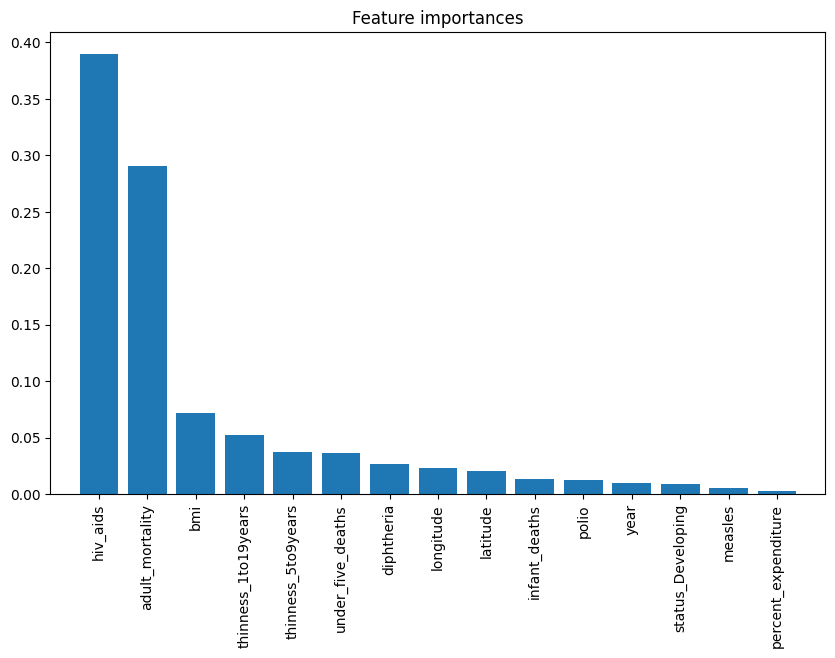

In [417]:
# plot feature importance
importances = best_rf_model.feature_importances_
indices = np.argsort(importances)[::-1]
# Print feature ranking
print("Feature ranking:")
for f in range(X.shape[1]):
    print(f"{f + 1}. feature {features[indices[f]]} ({importances[indices[f]]:.4f})")
# Plot the feature importances of the forest
plt.figure(figsize=(10, 6))
plt.title("Feature importances")
plt.bar(range(X.shape[1]), importances[indices], align="center")
plt.xticks(range(X.shape[1]), np.array(features)[indices], rotation=90)
plt.xlim([-1, X.shape[1]])
plt.show()
